In [51]:
import numpy as np
import pandas as pd
import scipy as sc

import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import roc_auc_score, make_scorer
from sklearn.model_selection import RandomizedSearchCV

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 10000)

In [2]:
#Task 1. Загрузка файла
data=pd.read_csv("C:/Users/gordee-ext/OneDrive - Louis Dreyfus Company/Desktop/data_breast.csv")

In [4]:
print(data.head(1))
print(data.shape)
data.info()

       id diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0  842302         M        17.99         10.38           122.8     1001.0   

   smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
0           0.1184            0.2776          0.3001               0.1471   

   symmetry_mean  fractal_dimension_mean  radius_se  texture_se  perimeter_se  \
0         0.2419                 0.07871      1.095      0.9053         8.589   

   area_se  smoothness_se  compactness_se  concavity_se  concave points_se  \
0    153.4       0.006399         0.04904       0.05373            0.01587   

   symmetry_se  fractal_dimension_se  radius_worst  texture_worst  \
0      0.03003              0.006193         25.38          17.33   

   perimeter_worst  area_worst  smoothness_worst  compactness_worst  \
0            184.6      2019.0            0.1622             0.6656   

   concavity_worst  concave points_worst  symmetry_worst  \
0           0.7119          

In [5]:
#В списке столбцов есть только одна категориальная переменная - diagnosis.

In [6]:
#Task 2. Расчет основных показателей и моды
print(data.describe())
data.mode().head(1)

                 id  radius_mean  texture_mean  perimeter_mean    area_mean  \
count  5.690000e+02   569.000000    569.000000      569.000000   569.000000   
mean   3.037183e+07    14.127292     19.289649       91.969033   654.889104   
std    1.250206e+08     3.524049      4.301036       24.298981   351.914129   
min    8.670000e+03     6.981000      9.710000       43.790000   143.500000   
25%    8.692180e+05    11.700000     16.170000       75.170000   420.300000   
50%    9.060240e+05    13.370000     18.840000       86.240000   551.100000   
75%    8.813129e+06    15.780000     21.800000      104.100000   782.700000   
max    9.113205e+08    28.110000     39.280000      188.500000  2501.000000   

       smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
count       569.000000        569.000000      569.000000           569.000000   
mean          0.096360          0.104341        0.088799             0.048919   
std           0.014064          0.052813     

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,8670,B,12.34,14.93,82.61,512.2,0.1007,0.1147,0.0,0.0,0.1601,0.05667,0.2204,0.8561,1.778,16.64,0.00508,0.01104,0.0,0.0,0.01344,0.001784,12.36,17.7,101.7,284.4,0.1216,0.1486,0.0,0.0,0.2226,0.07427


In [7]:
#Task 3. 
data.isnull().sum()
#В данных нет пропущенных значений

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

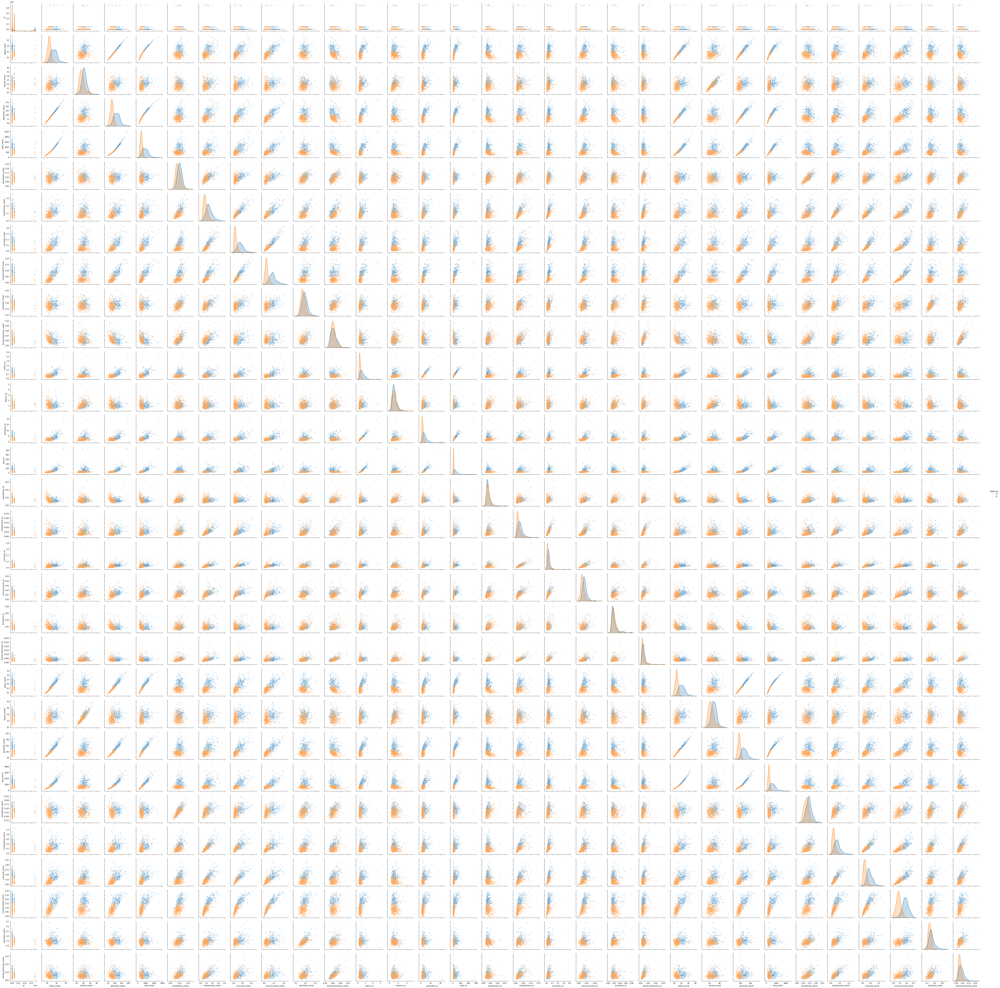

In [8]:
#Task 4. Визуализация корелляционной матрицы
graph = sns.pairplot(data=data ,plot_kws={'alpha':0.2}, hue="diagnosis")
graph
# Можно выделить несколькоп еременных, которые имеют ярковыраженную зависимость, такие как 'diagnosis_int','radius_mean','texture_mean',
#'area_worst','perimeter_worst', 'radius_worst'

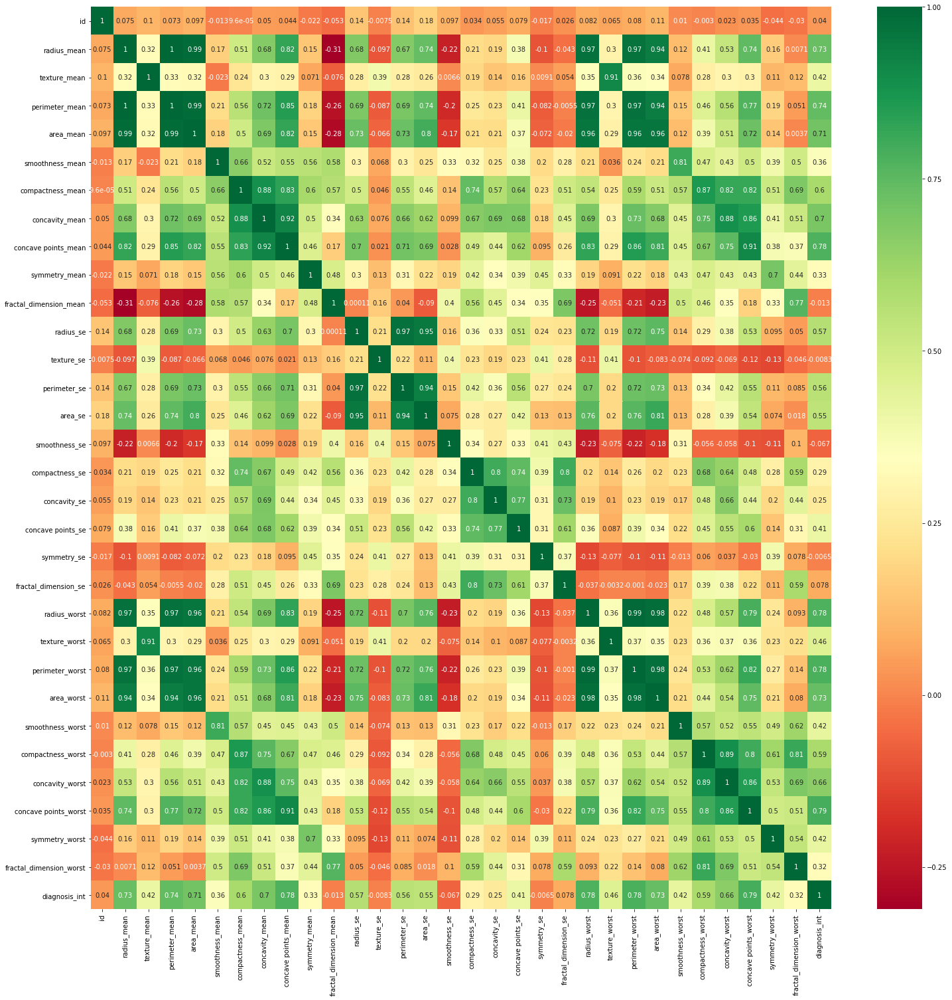

In [64]:
graph.savefig("lab.png")
corr=data.corr()
fig, ax = plt.subplots(figsize=(25,25))
sns.heatmap(corr,annot=True, xticklabels=corr.columns.values, yticklabels=corr.columns.values, ax=ax, cmap="RdYlGn")

In [17]:
#Заменим значения в diagnosis на 1/0
data['diagnosis_int']=data['diagnosis'].map({'M': 1, 'B': 0})


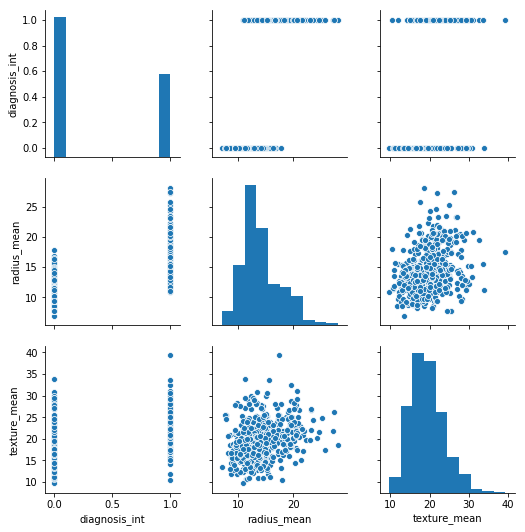

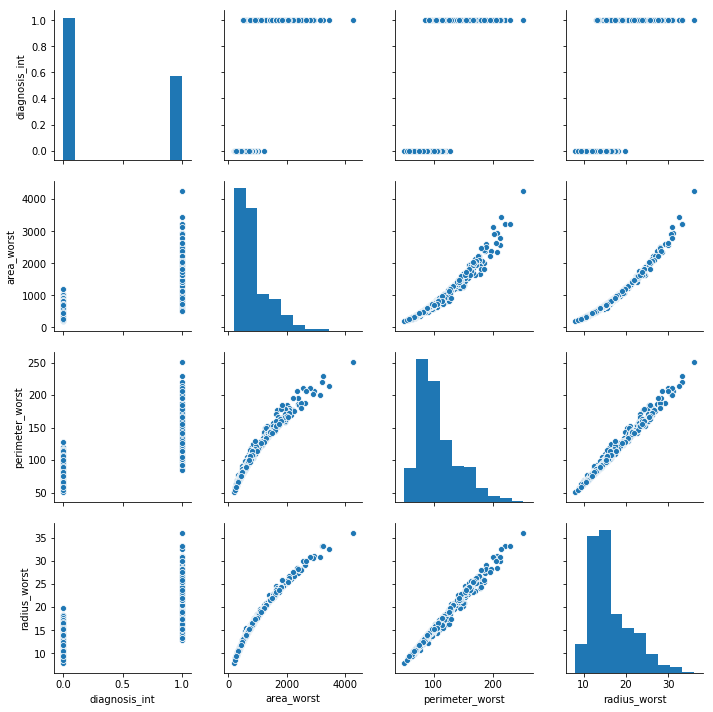

In [13]:
#Task 5. Визуализировать несколько взаимосвязей между переменными
sns.pairplot(data,vars=['diagnosis_int','radius_mean','texture_mean'])
sns.pairplot(data,vars=['diagnosis_int','area_worst','perimeter_worst', 'radius_worst'])
#полученные распределения похожи на логарифмические

In [15]:
#Task 6. С помощью статистических методов проверить взаимосвязи между переменными.
print(sc.stats.ttest_ind(data['diagnosis_int'], data['radius_mean']))
print(sc.stats.ttest_ind(data['diagnosis_int'], data['texture_mean']))
print(sc.stats.ttest_ind(data['diagnosis_int'], data['area_worst']))
print(sc.stats.ttest_ind(data['diagnosis_int'], data['perimeter_worst']))
print(sc.stats.ttest_ind(data['diagnosis_int'], data['radius_worst']))

Ttest_indResult(statistic=-92.23783542831167, pvalue=0.0)
Ttest_indResult(statistic=-104.25700264704194, pvalue=0.0)
Ttest_indResult(statistic=-36.877195400215314, pvalue=2.1519227514728112e-196)
Ttest_indResult(statistic=-75.87006808808943, pvalue=0.0)
Ttest_indResult(statistic=-78.06494831324127, pvalue=0.0)


In [159]:
# нулевые значения pvalue говорят о наличии взаимосвязи между переменными

In [19]:
#выделим список всех числовых (некатегориальных) столбцов наших данных
num_columns = data.select_dtypes(include=['int64', 'float64'], exclude='object').columns
coll = list(num_columns)

In [20]:
coll

['id',
 'radius_mean',
 'texture_mean',
 'perimeter_mean',
 'area_mean',
 'smoothness_mean',
 'compactness_mean',
 'concavity_mean',
 'concave points_mean',
 'symmetry_mean',
 'fractal_dimension_mean',
 'radius_se',
 'texture_se',
 'perimeter_se',
 'area_se',
 'smoothness_se',
 'compactness_se',
 'concavity_se',
 'concave points_se',
 'symmetry_se',
 'fractal_dimension_se',
 'radius_worst',
 'texture_worst',
 'perimeter_worst',
 'area_worst',
 'smoothness_worst',
 'compactness_worst',
 'concavity_worst',
 'concave points_worst',
 'symmetry_worst',
 'fractal_dimension_worst',
 'diagnosis_int']

In [21]:
#Task 7-8 Выбор стратегии Feature selection
#Feature selection сокращение размерности
high_corr = data[coll].corr(method ='pearson')[(abs(data[coll].corr(method ='pearson'))>=0.2)]\
.dropna(axis=1, how='all')['diagnosis_int'].dropna()

In [22]:
#Feature selection генерация новых значений
all_corr_col = []

for col in set(coll):
    if abs(sc.stats.pointbiserialr(data['diagnosis_int'], data[col])[0]) >=0.2:
        all_corr_col.append(col)

In [23]:
print(high_corr.shape)
len(all_corr_col)

(26,)


26

In [24]:
#Test/train split
x_train, x_test, y_train, y_test = train_test_split(data[coll].drop('diagnosis_int', axis = 1), data[coll],\
                                                          test_size=0.3, shuffle=True, random_state=42)

In [52]:
clf = LinearRegression()
clf.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [55]:
y_test_predict = clf.predict(x_test)

In [62]:
clf.score(x_test,y_test)

1.0